In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data=pd.read_csv('linear_regression_train.csv')

In [3]:
data

,ID,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,...,Feature_17,Feature_18,Feature_19,Feature_20,Feature_21,Feature_22,Feature_23,Feature_24,Feature_25,Target
0,1,-10.429837,21.684251,93.056324,128.914740,1.657315,-34.602633,-70.314374,-89.585318,-98.465642,...,-99.322780,19.560135,25.568291,-40.876179,-116.146068,-82.181299,-99.423518,-41.150654,113.117197,5235.690928
1,2,12.475081,11.652011,-47.621889,-21.892583,-25.844861,-46.951253,-114.500805,-96.257473,-138.354981,...,-89.763107,-8.250307,-8.798353,-23.452091,-56.769063,-26.722372,-97.694304,13.816113,8.711894,-1221.442146
2,3,7.696188,24.729547,43.782383,-53.282523,-69.145794,-57.072335,-114.149171,-105.408739,-71.892560,...,-3.859655,-17.301240,-1.622924,-39.351214,-73.973949,-33.844638,-100.874861,-38.895598,34.488334,-1102.758862
3,4,6.505033,22.092605,-25.161422,4.742729,-20.344550,-50.248793,-89.324731,-104.002016,-160.103875,...,48.557507,-1.997502,-0.856194,-34.259923,-3.113819,13.398035,-94.899866,-77.051331,-16.014027,437.940266
4,5,5.906445,19.909180,24.705865,-51.875251,-24.857500,-25.879977,-37.787560,-99.587673,-47.929647,...,3.556973,-26.643253,-0.976567,-44.127974,-44.249542,-6.166813,-97.099111,-5.426910,-42.191157,755.825367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,47996,3.562959,11.486509,61.145800,2.805889,-28.902789,-30.775352,-66.414021,-103.186976,-130.046256,...,-105.482960,48.452228,-0.643498,-1.883623,-80.008729,-27.849186,-92.497409,-69.854208,47.798525,3353.082152
47996,47997,-2.748224,22.360721,124.499793,-21.230197,-60.030819,-27.661729,-60.773068,-102.180412,-140.769031,...,-101.472074,-36.467914,7.985939,-30.925713,-134.529393,5.100088,-87.846292,-21.788868,9.368803,2149.681236
47997,47998,13.876292,26.976793,86.952262,-70.016487,-10.544583,-71.143920,-138.125870,-97.217351,-92.475987,...,-134.999520,4.757532,16.897211,-20.287205,-100.728629,-48.036962,-102.180933,-63.056645,109.054688,-1703.219366
47998,47999,-4.422768,19.522277,61.596420,-23.721260,-24.057237,-28.699059,-14.257085,-112.711818,-56.741174,...,-32.319919,-45.396834,-9.835818,-28.323818,-63.691619,-19.455079,-85.611697,2.956711,4.267729,4551.706842


In [4]:
X=data.iloc[:,1:-1].to_numpy()
y=data.iloc[:,-1].to_numpy()

In [5]:
y=y.reshape(-1,1)

In [6]:
X,y

(array([[ -10.42983652,   21.68425064,   93.05632423, ...,  -99.42351759,
          -41.15065424,  113.11719747],
        [  12.47508125,   11.65201123,  -47.62188868, ...,  -97.69430387,
           13.81611278,    8.71189399],
        [   7.69618811,   24.72954661,   43.78238349, ..., -100.87486091,
          -38.8955983 ,   34.4883343 ],
        ...,
        [  13.87629202,   26.97679336,   86.95226218, ..., -102.18093317,
          -63.05664522,  109.05468792],
        [  -4.4227684 ,   19.5222766 ,   61.59642015, ...,  -85.61169692,
            2.95671083,    4.26772866],
        [   3.86605987,   15.22206782,  -54.96995473, ...,  -97.34426689,
         -136.72256202,   37.2040866 ]]),
 array([[ 5235.69092808],
        [-1221.44214589],
        [-1102.75886179],
        ...,
        [-1703.21936555],
        [ 4551.70684165],
        [-2800.86325604]]))

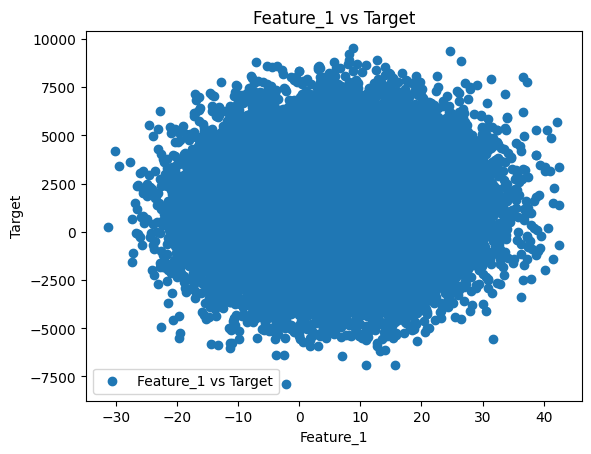

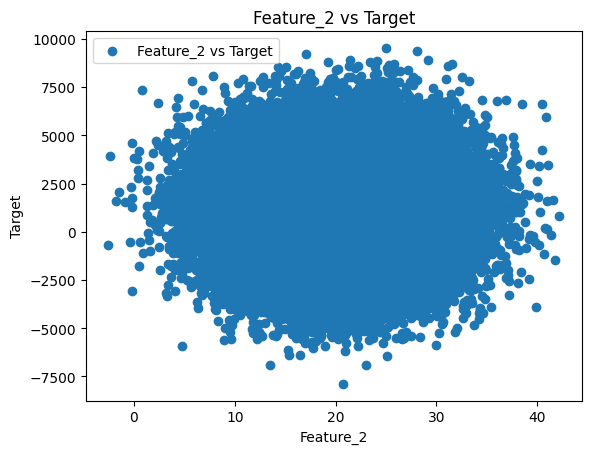

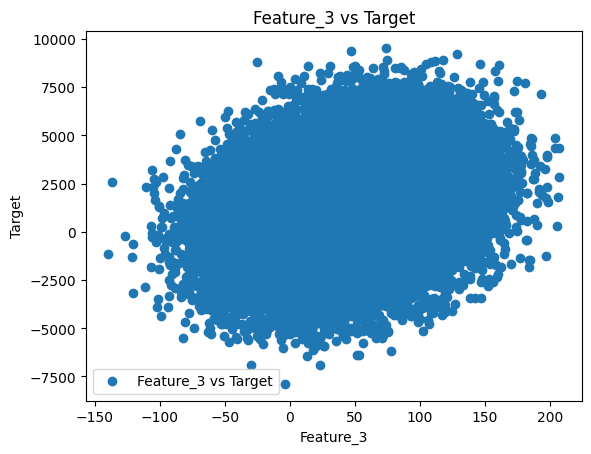

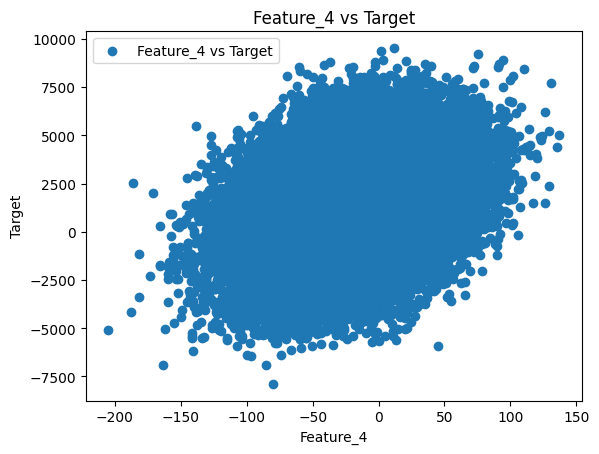

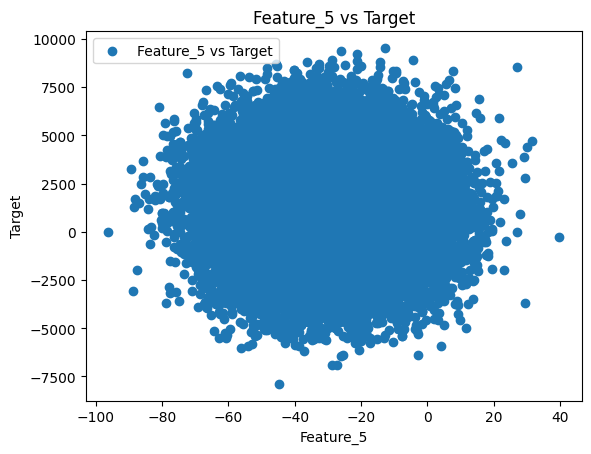

...

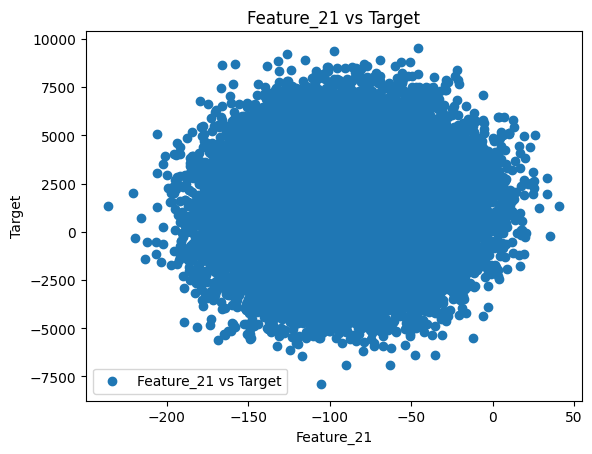

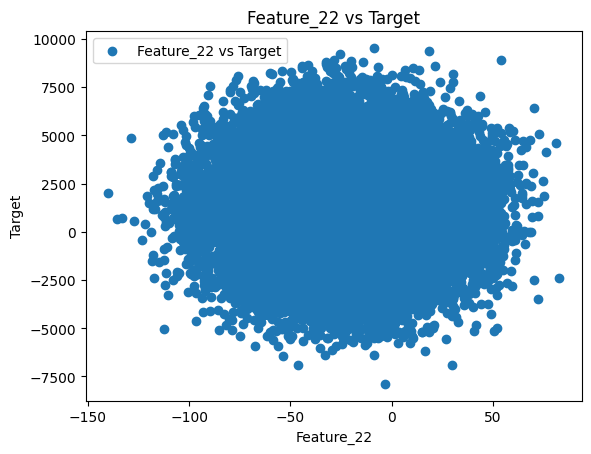

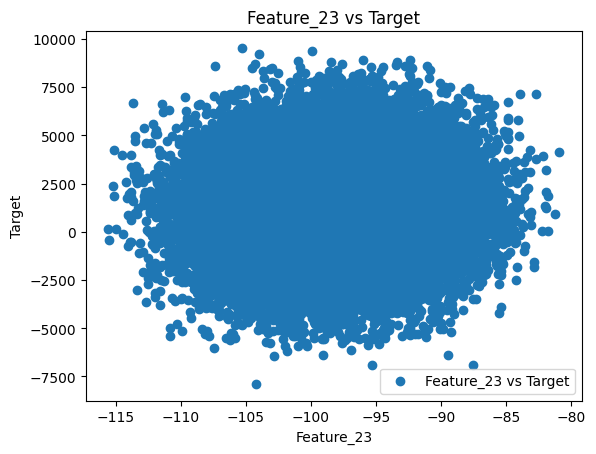

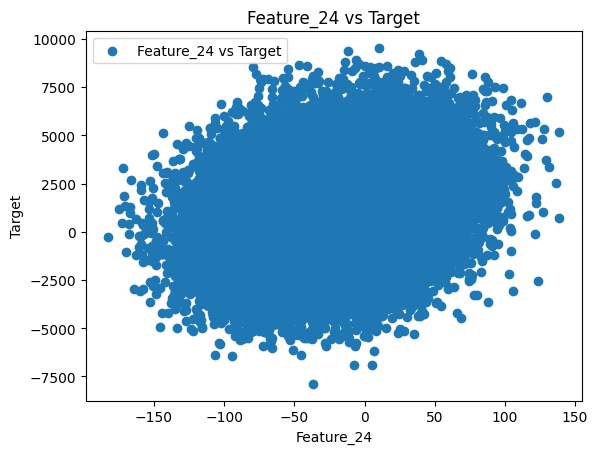

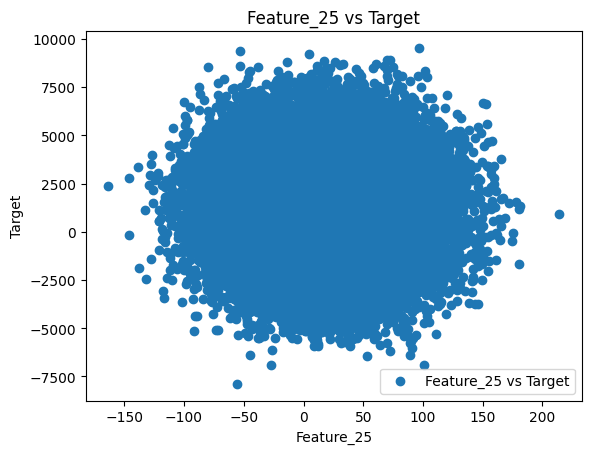

In [7]:
features = data.columns[:-1]  
target = data.columns[-1]
features=[feature for feature in features if feature!='ID']
for feature in features:
    plt.scatter(data[feature], data[target], label=f"{feature} vs {target}")
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.title(f"{feature} vs {target}")
    plt.legend()
    plt.show()

In [8]:
def z_score_normalize(X):
    mean=np.mean(X,axis=0)
    std=np.std(X,axis=0)
    X_scaled=(X-mean)/std
    return X_scaled

In [9]:
def compute_cost(X,y,w,b,lambda_):
    m=X.shape[0]
    f_wb=np.dot(X,w)+b
    cost=0.
    cost=np.sum((f_wb-y)**2)
    cost=cost/(2*m)
    reg_cost=0.
    reg_cost=np.sum(w**2)
    reg_cost=(lambda_/(2*m))*reg_cost
    total_cost=cost+reg_cost
    return total_cost

In [10]:
def gradient_descent(X,y,w_in,b_in,alpha,num_iters,lambda_):
    J_history=[]
    w=w_in[:]
    b=b_in
    m=X.shape[0]
    for i in range(num_iters):
        error=np.dot(X,w)+b
        dj_dw=(1/X.shape[0])*np.dot(X.T,(error-y))
        dj_db=(1/X.shape[0])*np.sum(error-y)
        dj_dw=dj_dw+(lambda_/m)*np.sum(w)
        w=w-alpha*dj_dw
        b=b-alpha*dj_db
        J_history.append(compute_cost(X,y,w,b,lambda_))
        if i%100==0:
            print(f"Iteration{i}: Cost={compute_cost(X,y,w,b,lambda_)}")
    return w,b,J_history    

In [11]:
X_scaled=z_score_normalize(X)
initial_w=np.ones(X_scaled.shape[1]).reshape(-1,1)
initial_b=0.
iterations=3000
alpha=0.03
lambda_=0
w_final,b_final,J_hist=gradient_descent(X_scaled,y,initial_w,initial_b,alpha,iterations,lambda_)


Iteration0: Cost=2917077.3818265838
Iteration100: Cost=64766.41955356938
Iteration200: Cost=58043.461810837965
Iteration300: Cost=58027.438927090276
Iteration400: Cost=58027.400338875275
Iteration500: Cost=58027.400245012475
Iteration600: Cost=58027.40024478195
Iteration700: Cost=58027.400244781384
Iteration800: Cost=58027.400244781384
Iteration900: Cost=58027.400244781384
Iteration1000: Cost=58027.400244781384
Iteration1100: Cost=58027.4002447814
Iteration1200: Cost=58027.4002447814
Iteration1300: Cost=58027.4002447814
Iteration1400: Cost=58027.4002447814
Iteration1500: Cost=58027.4002447814
Iteration1600: Cost=58027.4002447814
Iteration1700: Cost=58027.4002447814
Iteration1800: Cost=58027.4002447814
Iteration1900: Cost=58027.4002447814
Iteration2000: Cost=58027.4002447814
Iteration2100: Cost=58027.4002447814
Iteration2200: Cost=58027.4002447814
Iteration2300: Cost=58027.4002447814
Iteration2400: Cost=58027.4002447814
Iteration2500: Cost=58027.4002447814
Iteration2600: Cost=58027.4002

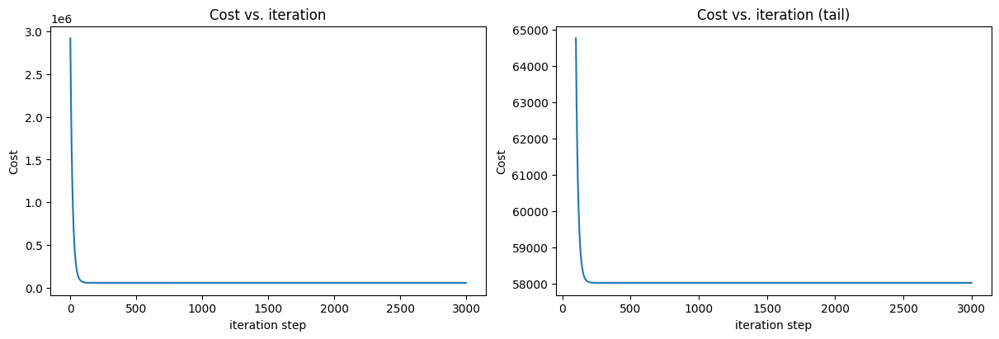

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, constrained_layout=True, figsize=(12, 4))
ax1.plot(J_hist)
ax2.plot(100 + np.arange(len(J_hist[100:])), J_hist[100:])
ax1.set_title("Cost vs. iteration");  ax2.set_title("Cost vs. iteration (tail)")
ax1.set_ylabel('Cost')             ;  ax2.set_ylabel('Cost') 
ax1.set_xlabel('iteration step')   ;  ax2.set_xlabel('iteration step') 
plt.show()

In [13]:
def accuracy(y_real,y_pred):
    ss_e=np.sum((y_real-y_pred)**2)
    ss_v=np.sum((y_real-np.mean(y_pred))**2)
    r_2=1-(ss_e/ss_v)
    mse=np.mean((y_real-y_pred)**2)
    return r_2,mse

In [14]:
X_scaled=z_score_normalize(X)
y_pred=np.dot(X_scaled,w_final)+b_final
r_2,mse=accuracy(y,y_pred)
print(f"accuracy={r_2:.4f}")
print(f"Mean Squared Error: {mse:.4f}")


accuracy=0.9751
Mean Squared Error: 116054.8005


In [15]:
def predict(X,w,b):
    return np.dot(X,w)+b

In [16]:
y_pred=predict(X_scaled,w_final,b_final)
predicted_values=pd.DataFrame(y_pred)
pd.set_option('display.max_rows',None)

In [17]:
predicted_values

,0
0,4843.779569
1,-1070.690966
2,-1075.548164
3,124.443434
4,1017.189400
5,2217.842490
6,6893.455239
7,364.130839
8,-1129.638866
9,-446.117102


In [18]:
test_data=pd.read_csv('linear_regression_test.csv')

In [19]:
test_data.head()

,ID,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,...,Feature_16,Feature_17,Feature_18,Feature_19,Feature_20,Feature_21,Feature_22,Feature_23,Feature_24,Feature_25
0,1,-13.296650,26.947913,95.977811,-25.167831,-25.863389,-46.432548,-30.120148,-99.220569,-95.771730,...,-46.275616,-36.211021,46.588536,-1.146567,-55.504215,-70.993172,-13.516826,-93.085585,-10.310519,-47.579967
1,2,13.740478,26.632355,-1.056834,113.386950,-26.957189,-40.305571,-8.916968,-99.182781,-65.653323,...,-53.961100,-27.153987,-20.942724,-5.648802,-27.809076,-151.023959,-37.020808,-99.351817,7.806000,75.691539
2,3,5.757701,5.729282,-7.846318,9.063737,-54.522411,-17.102457,-89.391519,-81.827183,-104.007163,...,-31.822475,-89.093319,-9.672241,15.562814,-13.848764,-79.762693,-59.360365,-104.771868,-29.851237,71.920184
3,4,-0.365463,26.040174,15.941714,-47.019942,-32.029202,-34.080470,-105.277503,-104.742190,-135.598491,...,-6.004513,-59.862724,16.676153,-14.092968,-30.554072,-86.409042,26.117858,-97.644419,-57.080490,3.592127
4,5,-7.076549,13.958214,52.805040,-41.259861,-22.072337,-42.073960,-42.290671,-91.763629,-18.252699,...,-38.963648,-42.747877,-10.722687,18.179473,-39.178435,-149.742179,-36.540063,-105.068864,-63.126882,41.053917


In [20]:
X_test=test_data.iloc[:,1:].to_numpy()

In [21]:
X_test

array([[ -13.29664984,   26.94791326,   95.97781082, ...,  -93.08558458,
         -10.31051873,  -47.57996745],
       [  13.74047822,   26.6323546 ,   -1.05683434, ...,  -99.35181737,
           7.80600033,   75.69153932],
       [   5.75770087,    5.72928201,   -7.84631752, ..., -104.77186847,
         -29.85123744,   71.92018423],
       ...,
       [  -5.85261615,   12.03721863,   44.8103347 , ..., -109.65445576,
          18.41335887,   -6.97955382],
       [  20.43179344,    3.02571363,  104.60594893, ...,  -99.04817113,
         -58.06021961,    8.32577778],
       [   4.48130396,   27.63513075,   45.58004581, ...,  -97.28312767,
         -22.5433931 ,   -4.87210286]])

In [22]:
X_test_scaled=z_score_normalize(X_test)
X_test_scaled

array([[-1.97837849e+00,  1.18957879e+00,  1.21509022e+00, ...,
         1.14979205e+00,  2.96607097e-01, -1.54140275e+00],
       [ 8.00824125e-01,  1.13374290e+00, -1.02510343e+00, ...,
        -1.91574770e-01,  7.39848321e-01,  1.38577932e+00],
       [-1.97421590e-02, -2.56490950e+00, -1.18184907e+00, ...,
        -1.35180564e+00, -1.81478789e-01,  1.29622543e+00],
       ...,
       [-1.21319079e+00, -1.44876427e+00,  3.38105347e-02, ...,
        -2.39698554e+00,  9.99369401e-01, -5.77312948e-01],
       [ 1.48863833e+00, -3.04328701e+00,  1.41428403e+00, ...,
        -1.26575430e-01, -8.71643590e-01, -2.13875416e-01],
       [-1.50945651e-01,  1.31117712e+00,  5.15804967e-02, ...,
         2.51254572e-01, -2.68407364e-03, -5.27269813e-01]])

In [23]:
y_pred_test=predict(X_test_scaled,w_final,b_final)
predicted_values_testdataset=pd.DataFrame(y_pred_test)
pd.set_option('display.max_rows',None)
print("Predictions on test data set : ")
predicted_values_testdataset

Predictions on test data set : 


,0
0,1106.021834
1,4507.663621
2,4087.477206
3,-1300.260413
4,786.257413
5,124.507036
6,3320.014390
7,5030.832045
8,685.441133
9,-456.911743
